# Office occupancy dataset

## Preparation

In [1]:
!pip install statsmodels==0.14.0

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import statsmodels.api as sm
import matplotlib
%matplotlib inline
import math
import sys

from sklearn.decomposition import PCA
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.subplots as sp
import plotly.express as px

from numpy.linalg import norm
from matplotlib.colors import ListedColormap
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.datasets import make_blobs
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from timeit import default_timer as timer
from scipy.sparse.linalg import eigs
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import RidgeCV, LassoCV, Ridge, Lasso



epsilon = sys.float_info.epsilon

np.random.seed(32)

## Loading Data

In [3]:
# Read the CSV file using pandas
df = pd.read_csv("Occupancy_datatraining.txt")

alist = df.columns.tolist()
alist[-1] = 'target'
df.columns = alist


df.head()

,date,Temperature,Humidity,Light,CO2,HumidityRatio,target
1,2015-02-04 17:51:00,23.18,27.2720,426.0,721.25,0.004793,1
2,2015-02-04 17:51:59,23.15,27.2675,429.5,714.00,0.004783,1
3,2015-02-04 17:53:00,23.15,27.2450,426.0,713.50,0.004779,1
4,2015-02-04 17:54:00,23.15,27.2000,426.0,708.25,0.004772,1
5,2015-02-04 17:55:00,23.10,27.2000,426.0,704.50,0.004757,1


In [4]:
# one = df['target'].value_counts().index[1]
# zero = df['target'].value_counts().index[0]
# mapping = {one : 1, zero : 0}
# df['target'] = df['target'].replace(mapping)
# df.head()

In [5]:
from sklearn.preprocessing import LabelEncoder

# Initialize a LabelEncoder object
encoder = LabelEncoder()


for j in df.columns:

    if not pd.api.types.is_numeric_dtype(df['{}'.format(j)] ):

        df['{}'.format(j)] = encoder.fit_transform(df['{}'.format(j)])

df.head()



,date,Temperature,Humidity,Light,CO2,HumidityRatio,target
1,0,23.18,27.2720,426.0,721.25,0.004793,1
2,1,23.15,27.2675,429.5,714.00,0.004783,1
3,2,23.15,27.2450,426.0,713.50,0.004779,1
4,3,23.15,27.2000,426.0,708.25,0.004772,1
5,4,23.10,27.2000,426.0,704.50,0.004757,1


#### Cleaning data

In [6]:
df.dropna(axis=1, inplace=True)
df.set_index(np.arange(len(df)), inplace=True)

df.head()

,date,Temperature,Humidity,Light,CO2,HumidityRatio,target
0,0,23.18,27.2720,426.0,721.25,0.004793,1
1,1,23.15,27.2675,429.5,714.00,0.004783,1
2,2,23.15,27.2450,426.0,713.50,0.004779,1
3,3,23.15,27.2000,426.0,708.25,0.004772,1
4,4,23.10,27.2000,426.0,704.50,0.004757,1


## Feature selection

### Correlation matrix (Pearson)

In [7]:
df.corr()

,date,Temperature,Humidity,Light,CO2,HumidityRatio,target
date,1.000000,-0.442176,0.642502,-0.121960,0.122284,0.504377,-0.098155
Temperature,-0.442176,1.000000,-0.141759,0.649942,0.559894,0.151762,0.538220
Humidity,0.642502,-0.141759,1.000000,0.037828,0.439023,0.955198,0.132964
Light,-0.121960,0.649942,0.037828,1.000000,0.664022,0.230420,0.907352
CO2,0.122284,0.559894,0.439023,0.664022,1.000000,0.626556,0.712235
HumidityRatio,0.504377,0.151762,0.955198,0.230420,0.626556,1.000000,0.300282
target,-0.098155,0.538220,0.132964,0.907352,0.712235,0.300282,1.000000


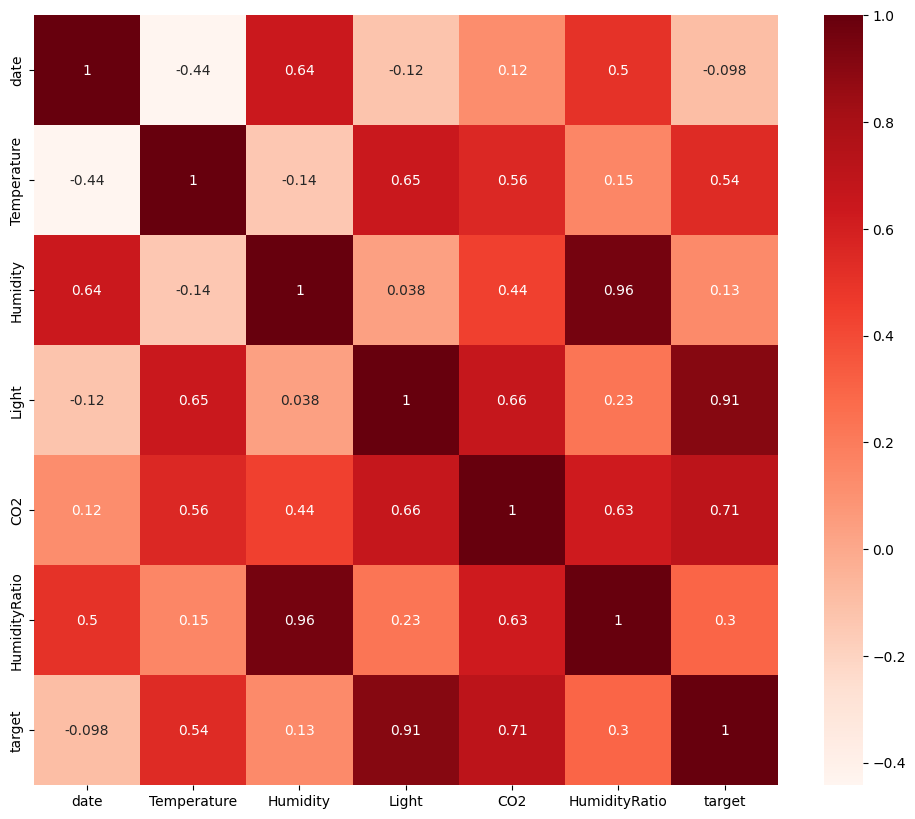

In [8]:
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = df.corr()
sns.heatmap(cor, annot = True, cmap=plt.cm.Reds)
plt.show()

In [9]:
#Correlation with output variable
p_threshold = 0.25
cor_target = abs(cor["target"])

#Selecting highly correlated features
relevant_features = cor_target[(cor_target > p_threshold)]
r_f = relevant_features.index.tolist().copy()

r_f

['Temperature', 'Light', 'CO2', 'HumidityRatio', 'target']

In [10]:
#selecting only variables with high correlation

df = df.loc[:, r_f]
df.head()

,Temperature,Light,CO2,HumidityRatio,target
0,23.18,426.0,721.25,0.004793,1
1,23.15,429.5,714.00,0.004783,1
2,23.15,426.0,713.50,0.004779,1
3,23.15,426.0,708.25,0.004772,1
4,23.10,426.0,704.50,0.004757,1


In [11]:
np.isnan(df).any()

Temperature      False
Light            False
CO2              False
HumidityRatio    False
target           False
dtype: bool

## EDA: Plotting the clusters

First Plot

In [12]:
features = r_f[:-1]


fig = px.scatter_matrix(
    df,
    dimensions=features,
    color="target"
)
fig.update_traces(diagonal_visible=False)
fig.show()

Second plot (many pca dimentions)

In [13]:
df[features]

,Temperature,Light,CO2,HumidityRatio
0,23.18,426.0,721.250000,0.004793
1,23.15,429.5,714.000000,0.004783
2,23.15,426.0,713.500000,0.004779
3,23.15,426.0,708.250000,0.004772
4,23.10,426.0,704.500000,0.004757
...,...,...,...,...
8138,21.05,433.0,787.250000,0.005579
8139,21.05,433.0,789.500000,0.005563
8140,21.10,433.0,798.500000,0.005596
8141,21.10,433.0,820.333333,0.005621


In [14]:
# Instantiate a PCA with n_components=3
pca = PCA(n_components=3)


# Fit the PCA
pca.fit(df)

# Transform the dataframe
transformed = pca.transform(df)

# Create a new dataframe with the transformed data and columns 'PC1', 'PC2', and 'PC3'
df1_pca = pd.DataFrame(transformed, columns=['PC1', 'PC2', 'PC3'])

In [15]:
df.dropna(axis=0, inplace=True)

pca = PCA()
components = pca.fit_transform(df[features])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}



fig = go.Figure()
scatter = go.Scatter3d(
            x=df1_pca['PC1'],
            y=df1_pca['PC2'],
            z=df1_pca['PC3'],
            mode='markers',
            marker=dict(size=6, color=df["target"], colorscale='RdBu', cmin=0, cmax=1, showscale=True) )
            #visible=False if i > 0 else True,  # Show only the first frame initially
            #name=f'Iteration {i}'
            #)
fig.add_trace(scatter)


fig.show()

3d scatter plot

In [16]:
df1_pca.head()

,PC1,PC2,PC3
0,239.753870,222.732348,-1.661472
1,234.837122,229.107129,-1.628047
2,232.823458,226.201095,-1.637152
3,228.128701,228.550932,-1.640965
4,224.775211,230.229287,-1.593775


## Data Classification

### X and y

In [17]:
X = np.array(df.loc[:,features].copy())

y = np.array(df.loc[:,['target']].copy())

X.shape

(8143, 4)

Scaling the x

In [18]:
X[0]

array([2.31800000e+01, 4.26000000e+02, 7.21250000e+02, 4.79298818e-03])

In [19]:
desired_min = 0
desired_max = 1

scaler = MinMaxScaler(feature_range=(desired_min, desired_max))

scaler.fit(X)
X = scaler.transform(X)

In [20]:
X[0]

array([1.        , 0.27549041, 0.190933  , 0.55731842])

Choosing how many labels

In [21]:
#reset the seed every time

np.random.seed(200)

percentage =  0.05 # 5% of the labels are used

n = int(percentage * len(y))

sample = np.random.choice(np.arange(len(y)), size=n, replace=False) # sample without replacement

In [22]:
a = np.arange(len(y))
b = (y == 1).reshape(len(y)) # boolean mask to select only ones in y

num_non_zero = np.count_nonzero(y) # number of ones in y
size_one = (percentage * num_non_zero) # number of ones to select
size_zero = (percentage * (len(y)-num_non_zero)) + 1 # number of zeros to select

rng_zero =np.random.choice(a[~b], size = int(size_zero)) # selecting the index of the zeros

rng_one = np.random.choice(a[b], size = int(size_one)) # selecting the index of the ones


In [23]:
# we keep in the sample a number of ones that is 1:1 with number of zeros. For modularity and reusability purposes,
# we first first select the zeros and the ones proportionally to ratio in the original dataset and
# then randomly select again from the sample of labeled ones

proportion_factor = 1
size =  int((proportion_factor * size_one) // 1)
selected = np.random.choice(np.arange(len(rng_zero)), size=size, replace=False)


In [24]:
rng_zero = rng_zero[selected] #indexes of final selected ones

In [25]:
sample = np.concatenate((rng_one,rng_zero)) # our final sample

In [26]:
print(f'the number of labeled data is : {y[sample].shape[0]}\n\nthe percentage of labeled point is: {round((y[sample].shape[0]/y.shape[0])*100, 3)} %')

the number of labeled data is : 172

the percentage of labeled point is: 2.112 %


#### x's splitting

In [27]:
# splitting X in labeled and unlabeled

labeled_x = X[sample]
unlabeled_x = np.delete(X, sample, axis=0)

#### y_true

In [28]:
y_true = np.array(df.loc[:, 'target'].drop(sample, axis = 0))

In [29]:
np.count_nonzero(y), len(y)

(1729, 8143)

#### y_unlabeled's values random generation

In [30]:
np.random.seed (120)

# initializing y unlabeled values
y_unlabeled_start =  np.random.rand(len(unlabeled_x))
y_unlabeled = y_unlabeled_start.copy()

# sample labeled points y_sample
y_sample = y[sample].reshape(len(y[sample]), 1)

checking shapes

In [31]:
print(f"X shape: {X.shape}, y_true shape: {y_true.shape}, y_unlabeled: {y_unlabeled.shape}")

X shape: (8143, 4), y_true shape: (7975,), y_unlabeled: (7975,)


In [32]:

df1_pca['colors'] = df['target'].copy()

df1_pca.loc[rng_zero, 'colors'] = 2
df1_pca.loc[rng_one, 'colors'] = 3

color_map = {0: 'rgba(156,150,90,0.6)', 1:'rgba(72,91,91,0.4)', 2:'#E78428', 3:"#053061"}



# Define names for each group
group_names = {
    0: 'Unlabeled negative',
    1: 'Unlabeled positive',
    2: 'labeled negative',
    3: 'labeled positive'
}

# Create an empty subplot with 3D scatter traces
fig = sp.make_subplots(rows=1, cols=1, specs=[[{'type': 'scatter3d'}]])

# Add a scatter3d trace for each group
for group, color in color_map.items():
    group_data = df1_pca[df1_pca['colors'] == group]
    fig.add_trace(
        go.Scatter3d(
            x=group_data['PC1'],
            y=group_data['PC2'],
            z=group_data['PC3'],
            mode='markers',
            marker=dict(color=color, size=6, line=dict(width=0)),
            name=group_names[group],
            showlegend=True
        )
    )

# Update the layout
fig.update_layout(scene=dict(xaxis_title='PC1', yaxis_title='PC2', zaxis_title='PC3'), title= {
        'text': 'PCA of labeled and unlabeled data',
        'x': 0.5,
        'xanchor': 'center',
    })

# Show the plot
fig.show()


## Weights similarity

In [33]:
# Create weights matrices for general dimentions of the data


d = X.shape[1] # dimentions of the data
temperature = 0.01# temperature parameter


labeled_x_cols = [labeled_x[:,i].reshape(len(labeled_x[:,i]), 1) for i in range(d)]
unlabeled_x_cols = [unlabeled_x.T[i, :].reshape(len(unlabeled_x.T[i, :]),1) for i in range(d)]



# Matrix W (unlabeled-labeled weights)

W_ij = (np.sqrt(sum((labeled_x_cols[i] - unlabeled_x_cols[i].T)**2 for i in range(d))) )


# Matrix W_hat (labeled-labeled weights)

W_hat_ij = (np.sqrt(sum((unlabeled_x_cols[i] - unlabeled_x_cols[i].T)**2 for i in range(d)))  )


In [34]:
W_ij = np.exp(-(W_ij**2)/ temperature)
W_hat_ij = np.exp(-(W_hat_ij**2) / temperature)

In [35]:
np.min(W_hat_ij), np.max(W_hat_ij), np.min(W_ij), np.max(W_ij)

(1.334869675350844e-112, 1.0, 4.925653222954307e-108, 1.0)

## Loss function

In [36]:
# Define the loss function

def loss_function(y_unlabeled):

    first_term = W_ij*((y_unlabeled - y_sample)**2)

    second_term = W_hat_ij*(y_unlabeled - y_unlabeled[:, np.newaxis])**2


    loss_function = np.sum(first_term) + (1/2) * np.sum(second_term)

    return loss_function

## Plotting functions

In [37]:
# Defining plots


### plot loss ###

def plot_loss(loss_list, iterations):


    plt.grid()
    plt.plot(iterations, loss_list, label='Loss')
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.legend(loc='best')
    plt.title('Loss function')

    plt.show()



### plot accuracy ###

def plot_accuracy(accuracy_list, iterations):


    plt.grid()
    plt.plot(iterations, accuracy_list, label='Accuracy', c='green')
    plt.xlabel('Iterations')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')
    plt.title('Accuracy')

    plt.show()



### plot change ###

def plot_change(change_list, iterations, threshold):

    #plot absolute values of changes
    plt.figure().set_figwidth(15)
    plt.grid()
    plt.plot(iterations, change_list,'.', markersize='5', c='orange',  label = 'Changes')

    #plot interpolation line
    coefficients = np.polyfit(iterations, change_list, 11)
    polynomial = np.poly1d(coefficients)
    y_fit = polynomial(iterations)

    plt.plot(iterations, y_fit, color= 'red', label = 'Interpolation line')

    #plot threshold
    plt.axhline(y=threshold, color='blue', label = 'threshold')

    plt.yscale('log')
    plt.ylim(0.000001, 0.1)

    plt.xlabel('Iterations')
    plt.legend(loc='best')
    plt.title('Absolute updating values for a random entry of y per iteration')
    plt.show()


### plot grad norm ###

def plot_gradnorm(change_list, iterations):
    plt.grid()
    plt.plot(iterations, change_list, label='Gradient norm', c='orange')
    plt.xlabel('Iterations')
    plt.title('Gradient norm')

    plt.show()


### Unique function for plotting both accuracy and loss ###

def plot_loss_accuracy(loss_list, accuracy_list, iterations_loss, iterations_accuracy):

    # Create a subplot with two plots in one row
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    # Plot loss
    ax1.plot(iterations_loss, loss_list, label='Loss')
    ax1.set_xlabel('Iterations')
    ax1.set_ylabel('Loss')
    ax1.legend(loc='best')
    ax1.set_title('Loss function')

    # Plot accuracy
    ax2.plot(iterations_accuracy, accuracy_list, label='Accuracy', c='green')
    ax2.set_xlabel('Iterations')
    ax2.set_ylabel('Accuracy')
    ax2.legend(loc='lower right')
    ax2.set_title('Accuracy')

    # Display the subplot
    plt.show()



## Define Gradient function

In [38]:
# Define auxilary function to check if the block is iterable
def is_iterable(obj):
    try:
        iter(obj)
        return True
    except TypeError:
        return False


# Compute the Gradient function

def compute_gradient(blocks, y_unlabeled):

    if is_iterable(blocks):

        j = blocks

        first_term_gradient = W_ij[:,j] * (y_unlabeled[j] - y_sample)

        second_term_gradient = W_hat_ij[:,j] * (y_unlabeled[j] - y_unlabeled[:, np.newaxis])


        return 2 * np.sum(first_term_gradient, axis = 0) + 2 * np.sum(second_term_gradient, axis = 0)


    else:

        j = blocks

        first_term_gradient = W_ij[:,[j]] * (y_unlabeled[j] - y_sample)

        #second_term_gradient = W_hat_ij[:,j] * (y_unlabeled[j] - y_unlabeled[:, np.newaxis])

        second_term_gradient = W_hat_ij[:,[j]] * (y_unlabeled[j] - y_unlabeled[:, np.newaxis])

        return 2 * np.sum(first_term_gradient) + 2 * np.sum(second_term_gradient)

## Hessian

In [39]:
# Hessian matrix of the Loss function

H = -2 * W_hat_ij
D = [2 * ( np.sum(W_ij[:,j]) + np.sum(W_hat_ij[:,j])) for j in range(len(unlabeled_x))]
np.fill_diagonal(H,D)

In [40]:
L,l = eigs(H, 1)
L = np.real(L)

print(f"The Lipschitz constant (the maximum eigenvalue of H) is: \n L = {L}")
print(f"1/L = {1/L}")

The Lipschitz constant (the maximum eigenvalue of H) is: 
 L = [2307.06969055]
1/L = [0.00043345]


## Gradient Descent

### Line Search: Armijo rule

In [41]:
# Define Armijo Rule to find alfa

def armijo_rule(y_unlabeled, starting_learning_rate, delta, gamma, gradient):

    alfa = starting_learning_rate
    loss_f = loss_function(y_unlabeled)
    grad_norm_squared = np.dot(gradient.T, gradient)

    while not ( loss_function(y_unlabeled - alfa * gradient)
                <= loss_f - gamma*alfa * grad_norm_squared
              ):

            alfa *= delta

    return alfa, loss_f

In [42]:
def gradient_descent_armijo(y_unlabeled, starting_learning_rate, delta, gamma, threshold, max_iterations):

    previous_y_unlabeled = y_unlabeled.copy()
    prev_loss = float('inf')

    loss_list = []

    anim_list = []             #needed to plot

    accuracy_list = []

    for iteration in range(max_iterations):

        if iteration % 2 == 0:

            anim_list.append(previous_y_unlabeled)
            accuracy_list.append(accuracy_score(y_true, y_unlabeled.round()))



        gradient = compute_gradient(np.arange(len(y_unlabeled)),y_unlabeled)
        alfa, current_loss = armijo_rule(y_unlabeled, starting_learning_rate, delta, gamma, gradient)
        loss_list.append(current_loss)
        y_unlabeled -= alfa * gradient



        previous_y_unlabeled = y_unlabeled.copy()

        print('iter:', iteration, '|', 'current_loss:', current_loss, '\n')


        if current_loss < threshold:
            break




    return y_unlabeled, loss_list, anim_list, accuracy_list

In [43]:
y_unlabeled = y_unlabeled_start.copy()

In [44]:
initial_loss = loss_function(y_unlabeled)

In [45]:
#### GRADIENT DESCENT with ALFA FOUND WITH ARMIJO RULE



max_iterations = 100
threshold = 0.006 * initial_loss #* (10**(pwr_n_points))
starting_learning_rate = 1

delta = 0.5
gamma = 0.4 #0.1

start = timer()

y_unlabeled, loss_list, anim_list, accuracy_list = gradient_descent_armijo(y_unlabeled, starting_learning_rate, delta, gamma, threshold, max_iterations)

end = timer()

print(f"\n Execution time in seconds: {(end - start)}")
print(f"Execution time in minutes: {(end - start)/60}")

iter: 0 | current_loss: 335748.03276675614 

iter: 1 | current_loss: 67850.48638678086 

iter: 2 | current_loss: 28968.051996030918 

iter: 3 | current_loss: 21890.795991244064 

iter: 4 | current_loss: 19015.101557667047 

iter: 5 | current_loss: 14147.250265351322 

iter: 6 | current_loss: 12498.406197337943 

iter: 7 | current_loss: 11356.869684312358 

iter: 8 | current_loss: 10811.344139786599 

iter: 9 | current_loss: 10440.719696467135 

iter: 10 | current_loss: 8248.256132030945 

iter: 11 | current_loss: 7473.578312325598 

iter: 12 | current_loss: 7114.775343884538 

iter: 13 | current_loss: 6889.683409149235 

iter: 14 | current_loss: 6058.9817047931665 

iter: 15 | current_loss: 5332.150160780137 

iter: 16 | current_loss: 5166.878883250117 

iter: 17 | current_loss: 4969.21501807141 

iter: 18 | current_loss: 4828.370311738633 

iter: 19 | current_loss: 4309.516430833992 

iter: 20 | current_loss: 3878.029672204819 

iter: 21 | current_loss: 3779.33060956476 

iter: 22 | c

### Results and plots

In [46]:
loss_list.append(loss_function(y_unlabeled))
# Assign labels
y_unlabeled = y_unlabeled.round()

In [47]:
not_equal = ~np.equal(y_true,y_unlabeled)
not_equal_num = np.sum(not_equal)
alist_misclassified = y_true[not_equal]

print(f"Number of misclassified points: {not_equal_num}")
print(f"The accuracy is: {accuracy_score(y_true, y_unlabeled)} || The f1 score is: {f1_score(y_true, y_unlabeled)}")
print('the # of zero-labeled points misclassified is:', len(alist_misclassified)-np.sum(alist_misclassified))


Number of misclassified points: 140
The accuracy is: 0.9824451410658307 || The f1 score is: 0.9580587177950869
the # of zero-labeled points misclassified is: 94


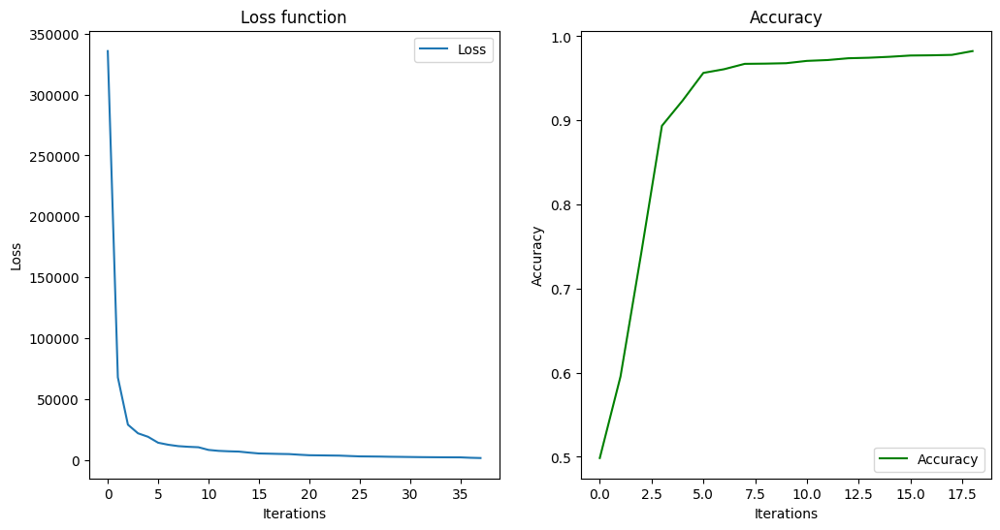

In [48]:
plot_loss_accuracy(loss_list, accuracy_list, range(len(loss_list)), range(len(accuracy_list)))

In [49]:
# Instantiate a PCA with n_components=3
pca = PCA(n_components=3)

df1 = df.drop(sample, axis =0)

# Fit the PCA
pca.fit(df1)

# Transform the dataframe
transformed = pca.transform(df1)

# Create a new dataframe with the transformed data and columns 'PC1', 'PC2', and 'PC3'
df1_pca = pd.DataFrame(transformed, columns=['PC1', 'PC2', 'PC3'])

In [50]:


subplot_fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]], subplot_titles=("Predicted", "True"))

y_list = [y_unlabeled, y_true]

fig1 = go.Figure()
fig2 = go.Figure()

for i in [1,2]:
    scatter = go.Scatter3d(
                x=df1_pca['PC1'],
                y=df1_pca['PC2'],
                z=df1_pca['PC3'],
                mode='markers',
                marker=dict(size=6, color=y_list[i-1], colorscale="RdBu", cmin=0, cmax=1, showscale=True) )

    if i == 1:
        fig1.add_trace(scatter)
    else:
        fig2.add_trace(scatter)

subplot_fig.update_layout(scene=dict(xaxis_title="PC1", yaxis_title="PC2", zaxis_title="PC3"),
                           scene2=dict(xaxis_title="PC1", yaxis_title="PC2", zaxis_title="PC3"))


subplot_fig.update_xaxes(title=dict(text='Predicted labels'), row=1, col=1)
subplot_fig.update_xaxes(title=dict(text='True Labels'), row=1, col=2)

subplot_fig.add_trace(fig1.data[0], row=1, col=1)
subplot_fig.add_trace(fig2.data[0], row=1, col=2)

subplot_fig.show()

In [51]:


# Instantiate a PCA with n_components=3
pca = PCA(n_components=3)

df1 = df.drop(sample, axis =0)

# Fit the PCA
pca.fit(df1)

# Transform the dataframe
transformed = pca.transform(df1)

# Create a new dataframe with the transformed data and columns 'PC1', 'PC2', and 'PC3'
df1_pca = pd.DataFrame(transformed, columns=['PC1', 'PC2', 'PC3'])

y_unlabeled_sequence = anim_list.copy()[::2]

# Create a 3D scatter plot
fig = go.Figure()

# Add a scatter plot for each iteration
for i, y_iter in enumerate(y_unlabeled_sequence):
    scatter = go.Scatter3d(
        x=df1_pca['PC1'],
        y=df1_pca['PC2'],
        z=df1_pca['PC3'],
        mode='markers',
        marker=dict(size=6, color=y_iter, colorscale='RdBu', cmin=0, cmax=1, showscale=True, ),
        visible=False if i > 0 else True,  # Show only the first frame initially
        name=f'Iteration {i}'
    )
    fig.add_trace(scatter)

# Create the animation frames
frames = [go.Frame(name=f'Iteration {i}', data=[go.Scatter3d(x=df1_pca['PC1'],
                                                             y=df1_pca['PC2'],
                                                             z=df1_pca['PC3'],
                                                             mode='markers',
                                                             marker=dict(size=6, color=y_iter, colorscale='RdBu', cmin=0, cmax=1))])
          for i, y_iter in enumerate(y_unlabeled_sequence)]

fig.frames = frames

# Update the layout to include the animation settings
fig.update_layout(
    updatemenus=[dict(type='buttons',
                      showactive=False,
                      buttons=[dict(label='Play',
                                    method='animate',
                                    args=[None, {'frame': {'duration': 500, 'redraw': True},
                                                 'fromcurrent': True, 'transition': {'duration': 0}}])])],
    scene=dict(xaxis_title='PC1', yaxis_title='PC2', zaxis_title='PC3'), title = {
        'text': 'PCA of labeled and unlabeled data',
        'x': 0.5,
        'xanchor': 'center',
    }
)

fig.show()

#### Fixed step size

In [52]:
# Define Gradient Descent with fixed Rule

def gradient_descent_fixed(y_unlabeled, y_true, alfa, threshold, max_iterations):

    #prev_loss = float('inf')

    y_fixed = y_unlabeled.copy()

    #needed lists to plot
    loss_list = []
    accuracy_list = [accuracy_score(y_true, y_fixed.round())]
    y_fixed_list = [y_unlabeled_start.copy()]


    for iteration in range(max_iterations):

        gradient = compute_gradient(np.arange(len(y_fixed)),y_fixed)



        y_fixed = y_fixed - alfa * gradient




        #plotting updates
        y_fixed_list.append(y_fixed)

        if iteration % 3 == 0:

          current_loss = loss_function(y_fixed)
          accuracy = accuracy_score(y_true, y_fixed.round())
          accuracy_list.append(accuracy)
          loss_list.append(current_loss)


          print('iter:', iteration, '|   current_loss:', current_loss)


          if current_loss < threshold:

            break




    return y_fixed, loss_list, accuracy_list, y_fixed_list

In [53]:
y_unlabeled = y_unlabeled_start.copy()
print(f"Initial value of Loss function: {loss_function(y_unlabeled)}")

Initial value of Loss function: 335748.03276675614


In [54]:
max_iterations = 150
threshold = 0.006*loss_function(y_unlabeled_start)
alfa = 1/L

start = timer()

y_unlabeled, loss_list, accuracy_list, y_unlabeled_list = gradient_descent_fixed(y_unlabeled, y_true, alfa, threshold, max_iterations)

end = timer()

print(f"___ \n")
print(f"Execution time in seconds: {(end - start)}")
print(f"Execution time in minutes: {(end - start)/60}")

iter: 0 |   current_loss: 79882.87464615739
iter: 3 |   current_loss: 26198.51624617479
iter: 6 |   current_loss: 19235.733124876664
iter: 9 |   current_loss: 16213.954345464885
iter: 12 |   current_loss: 14390.25947582644
iter: 15 |   current_loss: 13108.214457533071
iter: 18 |   current_loss: 12122.73626258631
iter: 21 |   current_loss: 11320.094327362
iter: 24 |   current_loss: 10640.037741673603
iter: 27 |   current_loss: 10047.636710079729
iter: 30 |   current_loss: 9521.245747932235
iter: 33 |   current_loss: 9046.713308420607
iter: 36 |   current_loss: 8614.3505007099
iter: 39 |   current_loss: 8217.244151280447
iter: 42 |   current_loss: 7850.2738220379115
iter: 45 |   current_loss: 7509.517521801787
iter: 48 |   current_loss: 7191.880876765451
iter: 51 |   current_loss: 6894.859004563095
iter: 54 |   current_loss: 6616.379407343219
iter: 57 |   current_loss: 6354.695573432624
iter: 60 |   current_loss: 6108.313061515294
iter: 63 |   current_loss: 5875.936860155359
iter: 66 |  

### Results and plots

In [55]:
loss_list.append(loss_function(y_unlabeled))
# Assign labels
y_unlabeled = y_unlabeled.round()

In [56]:
not_equal = ~np.equal(y_true,y_unlabeled)
not_equal_num = np.sum(not_equal)
alist_misclassified = y_true[not_equal]

print(f"Number of misclassified points: {not_equal_num}")
print(f"The accuracy is: {accuracy_score(y_true, y_unlabeled)} || The f1 score is: {f1_score(y_true, y_unlabeled)}")
print('the # of zero-labeled points misclassified is:', len(alist_misclassified)-np.sum(alist_misclassified))


Number of misclassified points: 187
The accuracy is: 0.976551724137931 || The f1 score is: 0.9446909198461994
the # of zero-labeled points misclassified is: 139


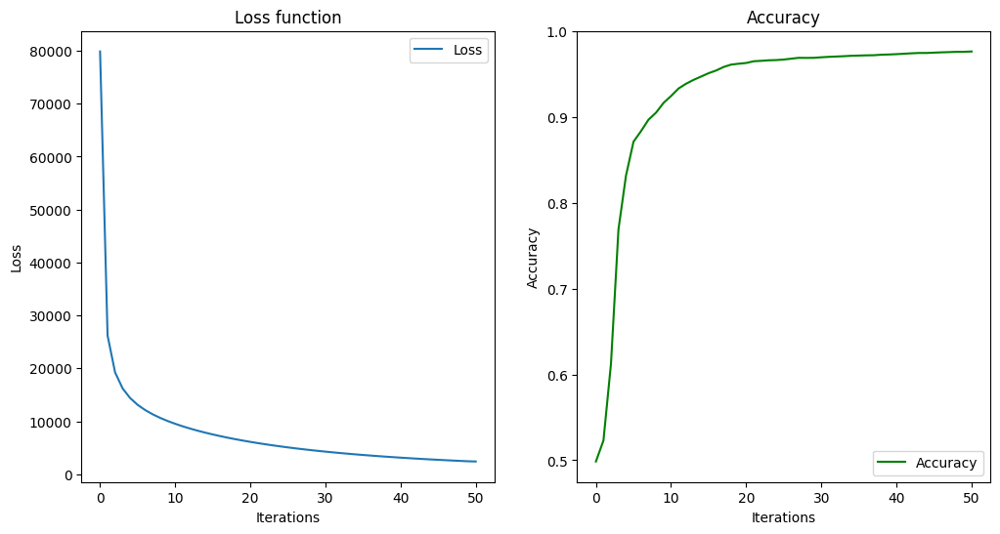

In [57]:
plot_loss_accuracy(loss_list, accuracy_list, range(len(loss_list)), range(len(accuracy_list)))

## BCGD: random rule

### Defining R_BCGD

In [58]:
# Defining Random BCGD algorithm

def R_BCGD(y_unlabeled, max_iterations, threshold, alfa):

    previous_y_unlabeled = y_unlabeled.copy()


    # Tolerance (for stopping condition)
    tolerance = (3/100)*len(y_unlabeled)
    c = 0 # tollerance (of change) counter


    # Lists needed for plotting
    loss_list = [loss_function(y_unlabeled)]
    accuracy_list = [accuracy_score(y_true, y_unlabeled.round())]
    change_list = []
    y_unlabeled_list = [previous_y_unlabeled]
    iter_list = [0]


    stop = False
    iterations = 0

    while not stop:

        iterations += 1

        j = np.random.randint(len(y_unlabeled)) # random index generator

        gradient_j = compute_gradient(j, y_unlabeled) # compute gradient only for that entry

        y_unlabeled[j] -= alfa * gradient_j     # update  the value

        change = np.abs(y_unlabeled[j] - previous_y_unlabeled[j])

        previous_y_unlabeled[j] = y_unlabeled[j] # needed to compute the change

        change_list.append(change) #needed for plotting


        # Print, and saving for plotting, the results

        if iterations%20000 == 0:

            iter_list.append(iterations)

            loss_list.append(loss_function(y_unlabeled))

            accuracy_list.append(accuracy_score(y_true, y_unlabeled.round()))

            y_unlabeled_list.append(y_unlabeled)


        # Stopping conditions

        if change < threshold or iterations >= max_iterations:

            c += 1
            if c%10 == 0:
                print(f'Tolerance counter: {c} | iteration: ', iterations, '|', 'change:', change)

            if c >= tolerance:

                print(f'\n\n\nLast iteration: ', iterations, '|', 'change:', change)

                iter_list.append(iterations)

                stop = True

    return y_unlabeled, loss_list, accuracy_list, change_list, y_unlabeled_list, iter_list

In [59]:
# setting the same starting y_unlabeled
y_unlabeled = y_unlabeled_start.copy()


#starting value loss function
loss_function(y_unlabeled)

335748.03276675614

In [60]:
max_iterations = 1000000
threshold = 0.5*1e-5
learning_rate = 1/L


start = timer()

y_unlabeled, loss_list, accuracy_list, change_list, y_unlabeled_list, iter_list = R_BCGD(y_unlabeled, max_iterations, threshold, learning_rate)

end = timer()

print(f"\n Execution time in seconds: {(end - start)}")
print(f"Execution time in minutes: {(end - start)/60}")

Tolerance counter: 10 | iteration:  34369 | change: 2.8876952451462046e-06
Tolerance counter: 20 | iteration:  54287 | change: 3.0538691678794194e-06
Tolerance counter: 30 | iteration:  73643 | change: 4.592214411236473e-06
Tolerance counter: 40 | iteration:  88256 | change: 3.3372837826561863e-06
Tolerance counter: 50 | iteration:  109123 | change: 2.873428295468994e-06
Tolerance counter: 60 | iteration:  157987 | change: 4.712749272939298e-06
Tolerance counter: 70 | iteration:  204106 | change: 4.780095485545921e-06
Tolerance counter: 80 | iteration:  236127 | change: 3.4013990912740155e-07
Tolerance counter: 90 | iteration:  268207 | change: 7.518296080699649e-07
Tolerance counter: 100 | iteration:  298320 | change: 2.7834675132565323e-06
Tolerance counter: 110 | iteration:  319046 | change: 1.5030205245958328e-06
Tolerance counter: 120 | iteration:  371791 | change: 4.518091482386133e-06
Tolerance counter: 130 | iteration:  402927 | change: 2.887934504647305e-06
Tolerance counter: 

### Results and plots

In [61]:
# Assign labels
y_unlabeled = y_unlabeled.round()

In [62]:
not_equal = ~np.equal(y_true,y_unlabeled)
not_equal_num = np.sum(not_equal)
alist_misclassified = y_true[not_equal]
print(f"Number of misclassified points: {not_equal_num}")
print(f"The accuracy is: {accuracy_score(y_true, y_unlabeled)} || The f1 score is: {f1_score(y_true, y_unlabeled)}")
print('the # of zero-labeled points misclassified is:', len(alist_misclassified)-np.sum(alist_misclassified))


Number of misclassified points: 220
The accuracy is: 0.9724137931034482 || The f1 score is: 0.9354081033470347
the # of zero-labeled points misclassified is: 168


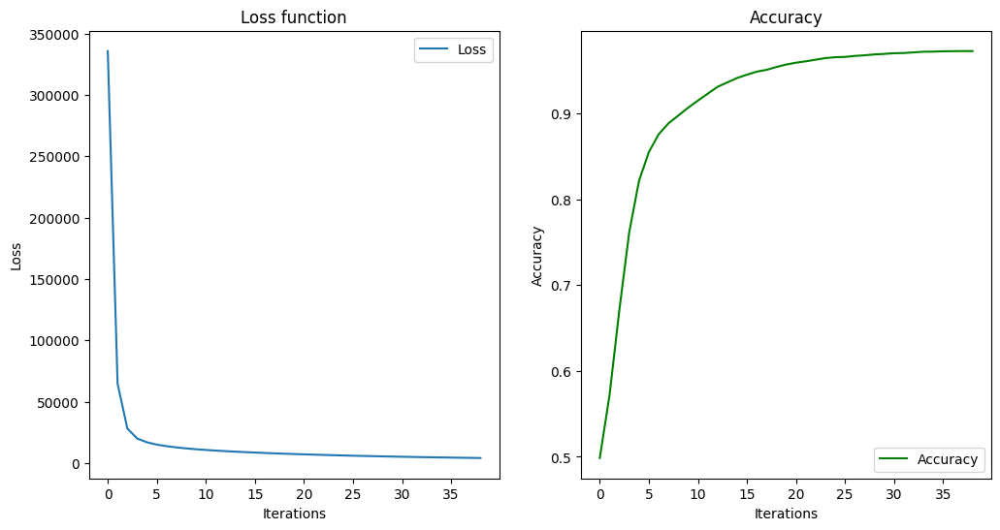

In [63]:
plot_loss_accuracy(loss_list,accuracy_list,range(len(loss_list)),range(len(accuracy_list)))

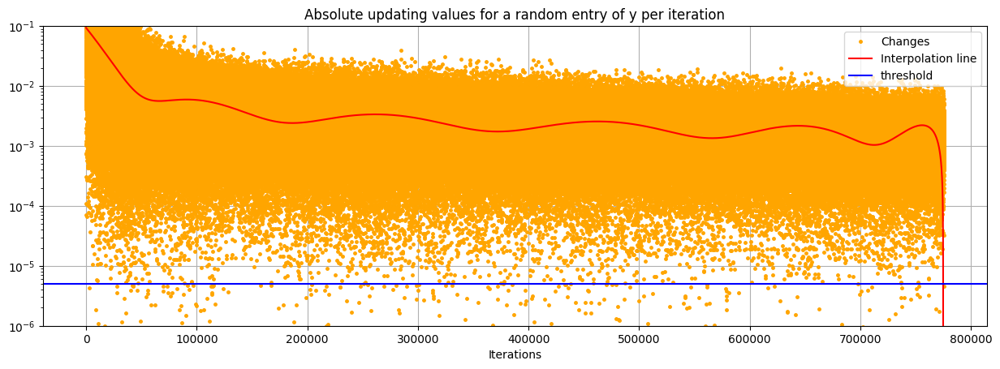

In [64]:
plot_change(change_list, range(len(change_list)), threshold)

In [65]:


subplot_fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]], subplot_titles=("Predicted", "True"))

y_list = [y_unlabeled, y_true]

fig1 = go.Figure()
fig2 = go.Figure()

for i in [1,2]:
    scatter = go.Scatter3d(
                x=df1_pca['PC1'],
                y=df1_pca['PC2'],
                z=df1_pca['PC3'],
                mode='markers',
                marker=dict(size=6, color=y_list[i-1], colorscale="RdBu", cmin=0, cmax=1, showscale=True) )
                #visible=False if i > 0 else True,  # Show only the first frame initially
                #name=f'Iteration {i}'
                #)
    if i == 1:
        fig1.add_trace(scatter)
    else:
        fig2.add_trace(scatter)

subplot_fig.update_layout(scene=dict(xaxis_title="PC1", yaxis_title="PC2", zaxis_title="PC3"),
                           scene2=dict(xaxis_title="PC1", yaxis_title="PC2", zaxis_title="PC3"))


subplot_fig.update_xaxes(title=dict(text='Predicted labels'), row=1, col=1)
subplot_fig.update_xaxes(title=dict(text='True Labels'), row=1, col=2)

subplot_fig.add_trace(fig1.data[0], row=1, col=1)
subplot_fig.add_trace(fig2.data[0], row=1, col=2)

subplot_fig.show()

In [ ]:


# Instantiate a PCA n_components=3
pca = PCA(n_components=3)

df1 = df.drop(sample, axis =0)

# Fit the PCA
pca.fit(df1)

# Transform the dataframe using the PCA
transformed = pca.transform(df1)

# Create a new dataframe with the transformed data
df1_pca = pd.DataFrame(transformed, columns=['PC1', 'PC2', 'PC3'])


y_unlabeled_sequence = anim_list.copy()[:]

# Create a 3D scatter plot
fig = go.Figure()

# Add a scatter plot for each iteration
for i, y_iter in enumerate(y_unlabeled_sequence):
    scatter = go.Scatter3d(
        x=df1_pca['PC1'],
        y=df1_pca['PC2'],
        z=df1_pca['PC3'],
        mode='markers',
        marker=dict(size=6, color=y_iter, colorscale="RdBu", cmin=0, cmax=1, showscale=True),
        visible=False if i > 0 else True,  # Show only the first frame initially
        name=f'Iteration {i}'
    )
    fig.add_trace(scatter)

# Create the animation frames
frames = [go.Frame(name=f'Iteration {i}', data=[go.Scatter3d(x=df1_pca['PC1'],
                                                             y=df1_pca['PC2'],
                                                             z=df1_pca['PC3'],
                                                             mode='markers',
                                                             marker=dict(size=6, color=y_iter, colorscale="RdBu",
                                                             cmin=0, cmax=1))])
          for i, y_iter in enumerate(y_unlabeled_sequence)]

fig.frames = frames

# Update the layout to include the animation settings
fig.update_layout(
    updatemenus=[dict(type='buttons',
                      showactive=False,
                      buttons=[dict(label='Play',
                                    method='animate',
                                    args=[None, {'frame': {'duration': 500, 'redraw': True},
                                                 'fromcurrent': True, 'transition': {'duration': 0}}])])],
    scene=dict(xaxis_title='PC1', yaxis_title='PC2', zaxis_title='PC3'), title= {
        'text': 'PCA of labeled and unlabeled data',
        'x': 0.5,
        'xanchor': 'center',
    }
)

fig.show()

## BCGD with Gauss-Southwell rule

In [67]:
# Heapify needed for computing the max of the gradient
import heapq


def BCGD_GS(y_unlabeled, alfa, threshold, max_iterations):

    previous_y_unlabeled = y_unlabeled.copy()

    #compute the whole gradient only once for all
    gradient = compute_gradient(np.arange(len(y_unlabeled)), y_unlabeled)

    # Squared norm of the gradient, calculate only once for all
    stop_condition = np.dot(gradient, gradient) #stop condition will be sqrt of this object (look the exit condition of the while)

    #Creating a list so to use heapify properties
    sorted_list = [(-np.abs(v),k) for k,v in zip(np.arange(len(gradient)), gradient)]
    heapq.heapify(sorted_list)

    #norm of the gradient to be used in the threshold for stopping condition
    initial_grad_norm = np.sqrt(stop_condition)
    # Stopping conditions
    threshold *= initial_grad_norm



    # Lists needed for plotting
    change_list = [initial_grad_norm]
    accuracy_list = [accuracy_score(y_true, y_unlabeled.round())]
    iter_list = [0]
    loss_list = [loss_function(y_unlabeled)]
    y_unlabeled_list = [y_unlabeled]

    stop = False
    iterations = 0
    tolerance = 0

    while not stop:

        if tolerance == 2000:

            tolerance +=1

            gradient = compute_gradient(np.arange(len(y_unlabeled)), y_unlabeled)

            print('gradient recomputed')

        iterations += 1

        j_max = heapq.heappop(sorted_list)[1] #take the index corrisponding to the max of the heap

        y_unlabeled[j_max] -= alfa * gradient[j_max] #update  the value

        new_grad = compute_gradient(j_max, y_unlabeled) #compute gradient only for that entry

        stop_condition = stop_condition - (gradient[j_max] ** 2) + (new_grad ** 2) #update stop condition

        gradient[j_max] = new_grad #update gradient

        heapq.heappush(sorted_list, (- np.abs(new_grad), j_max)) #update heap (thus recalculate the max)


        # Exit condition
        grad_norm = np.sqrt(stop_condition)
        change_list.append(grad_norm) #needed for plotting


        # Print, and saving for plotting, the results
        if iterations%20000 == 0:

            iter_list.append(iterations)
            loss_list.append(loss_function(y_unlabeled))
            accuracy_list.append(accuracy_score(y_true, y_unlabeled.round()))
            y_unlabeled_list.append(y_unlabeled)

            print('epoch:', iterations, '|', 'gradient norm:', grad_norm)


        if grad_norm < threshold:

            tolerance += 1

            print('\n\n', 'tolerance:', tolerance)

            print('epoch:', iterations, '|', 'gradient norm:', grad_norm)



            if tolerance > 10:

                stop = True

        if iterations >= max_iterations:

            stop = True

    return y_unlabeled, loss_list, accuracy_list, change_list, y_unlabeled_list, iter_list

In [68]:
y_unlabeled = y_unlabeled_start.copy()

In [69]:
loss_function(y_unlabeled)

335748.03276675614

In [70]:
start = timer()



alfa = 1/L
threshold = 1e-3 #* (10**(log10_n_points))
max_iterations = 1000000

y_unlabeled, loss_list, accuracy_list, change_list, y_unlabeled_list, iter_list = BCGD_GS(y_unlabeled, alfa, threshold, max_iterations)

end = timer()

print(f"\n Execution time in seconds: {(end - start)}")
print(f"Execution time in minutes: {(end - start)/60}")

epoch: 20000 | gradient norm: 2836.0284983935308
epoch: 40000 | gradient norm: 1394.5196334371365
epoch: 60000 | gradient norm: 835.8107173171362
epoch: 80000 | gradient norm: 544.6690642384915
epoch: 100000 | gradient norm: 383.9359495871828
epoch: 120000 | gradient norm: 283.2587764583037
epoch: 140000 | gradient norm: 219.02170304747924
epoch: 160000 | gradient norm: 175.38912383880458
epoch: 180000 | gradient norm: 145.66770943223483
epoch: 200000 | gradient norm: 124.05325259317677
epoch: 220000 | gradient norm: 107.79810446275756
epoch: 240000 | gradient norm: 95.7593559869069
epoch: 260000 | gradient norm: 85.94746948395381
epoch: 280000 | gradient norm: 77.63806907712149
epoch: 300000 | gradient norm: 70.67494146048236
epoch: 320000 | gradient norm: 64.73972483911203
epoch: 340000 | gradient norm: 59.7698422314399
epoch: 360000 | gradient norm: 55.33429462025625
epoch: 380000 | gradient norm: 51.81669525061864
epoch: 400000 | gradient norm: 48.353039938295744
epoch: 420000 | gr

### Results and plots

In [71]:
# Assign labels
y_unlabeled = y_unlabeled.round()

In [72]:
not_equal = ~np.equal(y_true,y_unlabeled)
not_equal_num = np.sum(not_equal)
alist_misclassified = y_true[not_equal]
print(f"Number of misclassified points: {not_equal_num}")
print(f"The accuracy is: {accuracy_score(y_true, y_unlabeled)} || The f1 score is: {f1_score(y_true, y_unlabeled)}")
print('the # of zero-labeled instances misclassified is:', len(alist_misclassified)-np.sum(alist_misclassified))

Number of misclassified points: 139
The accuracy is: 0.9825705329153605 || The f1 score is: 0.9591056192997941
the # of zero-labeled instances misclassified is: 124


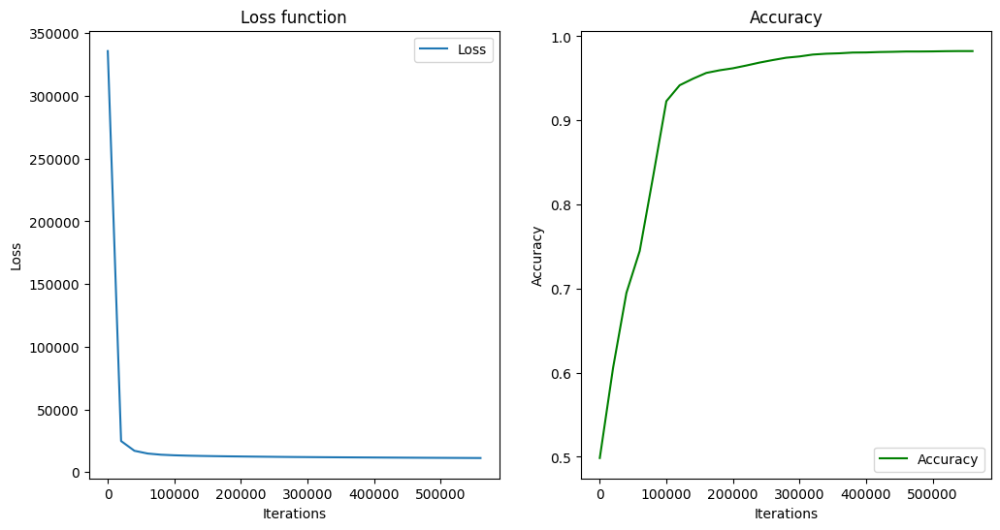

In [73]:
plot_loss_accuracy(loss_list,accuracy_list, iter_list, iter_list)

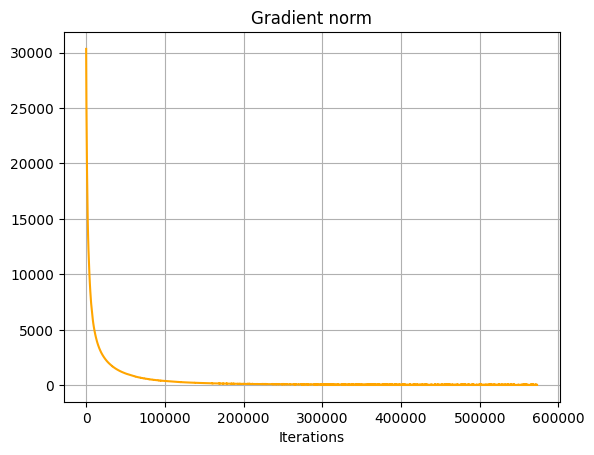

In [74]:
plot_gradnorm(change_list, range(len(change_list)))

In [75]:
# Instantiate a PCA  with n_components=3
pca = PCA(n_components=3)

df1 = df.drop(sample, axis =0)

# Fit the PCA
pca.fit(df1)

# Transform the dataframe
transformed = pca.transform(df1)

# Create a new dataframe with the transformed data and columns 'PC1', 'PC2', and 'PC3'
df1_pca = pd.DataFrame(transformed, columns=['PC1', 'PC2', 'PC3'])

In [76]:
subplot_fig = make_subplots(rows=1, cols=2, specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
                            subplot_titles=("Predicted", "True"))

y_list = [y_unlabeled, y_true]

fig1 = go.Figure()
fig2 = go.Figure()

for i in [1,2]:
    scatter = go.Scatter3d(
                x=df1_pca['PC1'],
                y=df1_pca['PC2'],
                z=df1_pca['PC3'],
                mode='markers',
                marker=dict(size=6, color=y_list[i-1], colorscale="RdBu", cmin=0, cmax=1, showscale=True) )

    if i == 1:
        fig1.add_trace(scatter)
    else:
        fig2.add_trace(scatter)

subplot_fig.update_layout(scene=dict(xaxis_title="PC1", yaxis_title="PC2", zaxis_title="PC3"),
                           scene2=dict(xaxis_title="PC1", yaxis_title="PC2", zaxis_title="PC3"))


subplot_fig.update_xaxes(title=dict(text='Predicted labels'), row=1, col=1)
subplot_fig.update_xaxes(title=dict(text='True Labels'), row=1, col=2)


subplot_fig.add_trace(fig1.data[0], row=1, col=1)
subplot_fig.add_trace(fig2.data[0], row=1, col=2)

subplot_fig.show()

In [ ]:
pca = PCA(n_components=3)

df1 = df.drop(sample, axis =0)

# Fit the PCA
pca.fit(df1)

# Transform the dataframe using the PCA
transformed = pca.transform(df1)

# Create a new dataframe with the transformed data
df1_pca = pd.DataFrame(transformed, columns=['PC1', 'PC2', 'PC3'])

y_unlabeled_sequence = anim_list.copy()

# Create a 3D scatter plot
fig = go.Figure()

# Add a scatter plot for each iteration
for i, y_iter in enumerate(y_unlabeled_sequence):
    scatter = go.Scatter3d(
        x=df1_pca['PC1'],
        y=df1_pca['PC2'],
        z=df1_pca['PC3'],
        mode='markers',
        marker=dict(size=6, color=y_iter, colorscale="RdBu", cmin=0, cmax=1, showscale=True),
        visible=False if i > 0 else True,  # Show only the first frame initially
        name=f'Iteration {i}'
    )
    fig.add_trace(scatter)

# Create the animation frames
frames = [go.Frame(name=f'Iteration {i}', data=[go.Scatter3d(x=df1_pca['PC1'],
                                                             y=df1_pca['PC2'],
                                                             z=df1_pca['PC3'],
                                                             mode='markers',
                                                             marker=dict(size=6, color=y_iter, colorscale='RdBu', cmin=0, cmax=1))])
          for i, y_iter in enumerate(y_unlabeled_sequence)]

fig.frames = frames

# Update the layout to include the animation settings
fig.update_layout(
    updatemenus=[dict(type='buttons',
                      showactive=False,
                      buttons=[dict(label='Play',
                                    method='animate',
                                    args=[None, {'frame': {'duration': 500, 'redraw': True},
                                                 'fromcurrent': True, 'transition': {'duration': 0}}])])],
    scene=dict(xaxis_title='PC1', yaxis_title='PC2', zaxis_title='PC3'), title = {
        'text': 'PCA of labeled and unlabeled data',
        'x': 0.5,
        'xanchor': 'center',
    }
)

fig.show()